**CODEBOOK FOR ANALYSIS**

This is the jupyter notebook for the **analysis**. In the first cell below, you will find the code for data cleaning, and for standardizing the date format for the three input files guardianheadlines.csv, eu_legislation.csv, and Europe_funding.csv. 

In [2]:
#this code creates three pandas dataframes based on the three csv files guardianheadlines.csv, eu_legislation.csv, and Europe_funding.csv. It standardizes the date column as the three csv files use different formats. 
import pandas as pd
import sys
import matplotlib.pyplot as plt
import time 
from datetime import datetime
import regex

#read files into panda 
#guardian file - csv format is 2024-09-25T00:24:41T
df_headlines = pd.read_csv('guardianheadlines.csv', parse_dates=['Date'])
#remove time
df_headlines['Date'] = df_headlines['Date'].dt.date
#convert to date time to keep format consistent across the three frames 
df_headlines['Date'] = pd.to_datetime(df_headlines['Date'], errors='coerce')

#legislation file — csv format is day first (e.g., 14/12/2022)
df_legislation = pd.read_csv('eu_legislation.csv', parse_dates=['Date'], dayfirst=True)

#the file included some invalid entries
df_legislation = df_legislation[
    (df_legislation['Date'].dt.year >= 2022) & (df_legislation['Date'].dt.year < 2025)
]


#funding file — this file has mixed formats (e.g., "04.05.22" and "from 04/05/2022 to 06/06/2022")
df_funding = pd.read_csv('Europe_funding.csv')

#get rid of typos
df_funding['donor'] = df_funding['donor'].str.strip().str.title()

#remove duplicate rows
duplicates = df_funding[df_funding.duplicated()]
df_funding = df_funding.drop_duplicates()

#group EU institutions together 
df_funding['donor'] = df_funding['donor'].replace({
    'EU (Commission and Council)': 'European Union',
    'Eu (Commission And Council)': 'European Union',
    'European Investment Bank': 'European Union',
    'EU Commission': 'European Union',
    'EU Council': 'European Union'
})

# Use only allocations as this is aid that has actually been fulfilled (Allocations are considered actual transfers)
df_funding = df_funding[df_funding['measure'].str.lower() == 'allocation']


# I decided to drop the 'explanation' column because I don't need it for the analysis
df_funding = df_funding.drop(columns=['explanation'])

# regex function to extract from dates, for this format: from 04/05/2022 to 06/06/2022 I will use the first date after 'from'
def extract_date(text):
    try:
        match = regex.search(r'(\d{2})[./](\d{2})[./](\d{2,4})', str(text))
        if match:
            day, month, year = match.groups()
            year = '20' + year if len(year) == 2 else year
            return f'{day}.{month}.{year}' 
        return None
    except:
        sys.stderr.write(f'Cannot extract date.')
        return

# Apply the function to the 'announcement_date' column
df_funding['announcement_date_clean'] = df_funding['announcement_date'].apply(extract_date)

# Convert to datetime
df_funding['announcement_date_clean'] = pd.to_datetime(df_funding['announcement_date_clean'], format='%d.%m.%Y', errors='coerce')


In [4]:
#test function by printing first 10 rows for funding
print(df_funding['announcement_date_clean'].head(10))


2    2022-09-04
3    2022-09-04
4    2022-09-04
5    2022-11-01
6    2022-11-01
7    2022-12-09
8    2022-12-16
9    2023-01-31
10   2023-02-24
11   2023-03-20
Name: announcement_date_clean, dtype: datetime64[ns]


In [6]:
#test function by printing first 10 rows for legislation
print(df_legislation['Date'].head(10))

0    2022-12-14
2    2023-02-02
3    2022-05-19
4    2022-09-15
5    2022-11-14
6    2024-03-13
7    2023-11-27
8    2023-05-09
9    2022-04-27
10   2023-02-23
Name: Date, dtype: datetime64[ns]


In [8]:
#test function by printing first 10 rows for headlines
print(df_headlines['Date'].head(10))

0   2024-09-25
1   2024-10-12
2   2024-12-09
3   2024-12-10
4   2024-12-08
5   2024-09-23
6   2024-12-25
7   2024-12-26
8   2024-12-01
9   2024-12-23
Name: Date, dtype: datetime64[ns]


In [10]:
#test print first 10 rows of guardian pandas frame
df_headlines.head(10)

,Headline,Link,Date
0,Ukraine war briefing: Trump expected to snub Z...,https://www.theguardian.com/world/2024/sep/25/...,2024-09-25
1,Ukraine war briefing: Zelenskyy appeals to Pop...,https://www.theguardian.com/world/2024/oct/12/...,2024-10-12
2,Russia-Ukraine war: Zelenskyy suggests foreign...,https://www.theguardian.com/world/live/2024/de...,2024-12-09
3,"Ukraine war briefing: Our war dead 43,000 and ...",https://www.theguardian.com/world/2024/dec/10/...,2024-12-10
4,Trump calls for ‘immediate ceasefire’ in Ukrai...,https://www.theguardian.com/world/2024/dec/08/...,2024-12-08
5,Ukraine war briefing: Zelenskyy arrives in US ...,https://www.theguardian.com/world/2024/sep/23/...,2024-09-23
6,Russia launches major Christmas Day attack on ...,https://www.theguardian.com/world/2024/dec/25/...,2024-12-25
7,Ukraine war briefing: Biden slams Russia’s ‘ou...,https://www.theguardian.com/world/2024/dec/26/...,2024-12-26
8,Ukraine war briefing: Russian missile strike k...,https://www.theguardian.com/world/2024/dec/01/...,2024-12-01
9,Ukraine war briefing: Putin meets Slovak PM in...,https://www.theguardian.com/world/2024/dec/23/...,2024-12-23


In [12]:
#test print first 10 rows of legislation pandas frame
df_legislation.head(10)

,Title,Link,Form,Author,Date
0,Decision (EU) 2022/2512 of the European Parlia...,https://eur-lex.europa.eu/legal-content/AUTO/?...,Decision,"European Parliament, Council of the European U...",2022-12-14
2,Council Decision (CFSP) 2023/231 of 2 February...,https://eur-lex.europa.eu/legal-content/AUTO/?...,Decision,Council of the European Union,2023-02-02
3,P9_TA(2022)0208 Temporary trade liberalisation...,https://eur-lex.europa.eu/legal-content/AUTO/?...,Legislative resolution,"European Parliament, Committee on Internationa...",2022-05-19
4,European Parliament resolution of 15 September...,https://eur-lex.europa.eu/legal-content/AUTO/?...,Resolution,European Parliament,2022-09-15
5,Council Decision (CFSP) 2022/2245 of 14 Novemb...,https://eur-lex.europa.eu/legal-content/AUTO/?...,Decision,Council of the European Union,2022-11-14
6,P9_TA(2024)0154 – Temporary trade-liberalisati...,https://eur-lex.europa.eu/legal-content/AUTO/?...,Legislative resolution,"European Parliament, Committee on Agriculture ...",2024-03-13
7,Council Decision (CFSP) 2023/2677 of 27 Novemb...,https://eur-lex.europa.eu/legal-content/AUTO/?...,Decision,Council of the European Union,2023-11-27
8,P9_TA(2023)0125 EU/Euratom/Ukraine Association...,https://eur-lex.europa.eu/legal-content/AUTO/?...,Legislative resolution,"European Parliament, Committee on Internationa...",2023-05-09
9,Proposal for a REGULATION OF THE EUROPEAN PARL...,https://eur-lex.europa.eu/legal-content/AUTO/?...,Proposal for a regulation,"European Commission, Directorate-General for T...",2022-04-27
10,Proposal for a REGULATION OF THE EUROPEAN PARL...,https://eur-lex.europa.eu/legal-content/AUTO/?...,Proposal for a regulation,"European Commission, Directorate-General for T...",2023-02-23


In [14]:
#test print first 10 rows of funding pandas frame
df_funding.head(10)

,donor,announcement_date,source_reported_value,reporting_currency,aid_type_general,aid_type_specific,measure,announcement_date_clean
2,Austria,04.09.22,200.000.000,EUR,Humanitarian,Reconstruction,Allocation,2022-09-04
3,Austria,04.09.22,350.000.000,EUR,Humanitarian,Reconstruction,Allocation,2022-09-04
4,Austria,04.09.22,75.000.000,EUR,Humanitarian,Reconstruction,Allocation,2022-09-04
5,Austria,01.11.22,5.005.199,EUR,Humanitarian,Equipment,Allocation,2022-11-01
6,Austria,01.11.22,5.000.000,EUR,Humanitarian,Equipment,Allocation,2022-11-01
7,Austria,09.12.22,0,EUR,Humanitarian,Consolidation,Allocation,2022-12-09
8,Austria,16.12.22,5.000.000,EUR,Humanitarian,Contribution,Allocation,2022-12-16
9,Austria,31.01.23,5.000.000,EUR,Humanitarian,Contribution,Allocation,2023-01-31
10,Austria,24.02.23,3.147.960,EUR,Humanitarian,Consolidation,Allocation,2023-02-24
11,Austria,20.03.23,18.000.000,EUR,Humanitarian,Assistance,Allocation,2023-03-20


The next code cell is also part of the **data cleaning**. It updates the Europe_funding dataset to include the column 'reported_value_euros'.

In [17]:
#this code updates the source_reported_value for the funding dataset, to convert all values to euros

import requests
import json
import pandas as pd
import sys

exchange_rates = {}  #collect exchange rates in dictionary 


def convert_to_euros(row):
    try:
        if row['source_reported_value'] == "Not Given":
            return 0 #set missing values to 0 for later calculations
            
        source_value = float(str(row['source_reported_value']).replace('.', ''))
             #use replace because format is European, i.e. comma-separated

        source_currency = row['reporting_currency']

        if source_currency == 'EUR':
            return source_value
        
        # download exchange rate per currency
        if source_currency not in exchange_rates:
            url = f'https://open.er-api.com/v6/latest/{source_currency}'
            r = requests.get(url)
            j = r.json()
            exchange_rates[source_currency] = j['rates']['EUR']

        conversion_to_EUR = exchange_rates[source_currency]
        return source_value * conversion_to_EUR
    
    except Exception as e:
        sys.stderr.write(f"Error: {e} for row: {row}")
        return None
#apply function to dataframe
df_funding['reported_value_euros'] = df_funding.apply(convert_to_euros, axis=1) #axis=1 means apply the function for each row 


#this next function converts the original source_reported_value column to a float format so that the original currency value and the euro value can be properly compared
def standardize_source_reported_value(row):
    try:
        if row['source_reported_value'] == "Not Given":
                return 0 #set missing values to 0 for later calculations
            
        standardized_value = float(str(row['source_reported_value']).replace('.', '')) #   #use replace because format is European, i.e. comma-separated
        return standardized_value
    except:
        sys.stderr.write(f'cannot process row')
        return
          

    
df_funding['source_reported_value'] = df_funding.apply(standardize_source_reported_value, axis=1) #apply the function to the dataframe 



In [19]:
#test conversion
print(df_funding.loc[137])

donor                                 Bulgaria
announcement_date                     23.08.23
source_reported_value                  52743.0
reporting_currency                         USD
aid_type_general                  Humanitarian
aid_type_specific                    Equipment
measure                             Allocation
announcement_date_clean    2023-08-23 00:00:00
reported_value_euros              46423.122768
Name: 137, dtype: object


---------------------------------------------------------------------------------------------------------------------------------------------

As a next step, I will visualize the **amount of funding per donor**. First, the amount of funding per donor is calculated. 

In [26]:
#calculate the amount of funding per country for map
funding_per_donor = df_funding.groupby('donor')['reported_value_euros'].sum()
print(funding_per_donor)

donor
Austria           7.833232e+08
Belgium           2.040819e+09
Bulgaria          2.310718e+08
Croatia           2.373591e+08
Cyprus            4.000000e+06
Denmark           9.030702e+09
Estonia           7.508506e+08
European Union    4.889622e+10
Finland           2.698399e+09
France            3.444200e+09
Germany           4.777920e+09
Hungary           4.124731e+07
Ireland           1.634120e+08
Italy             1.425377e+09
Latvia            5.165094e+08
Lithuania         1.014156e+09
Luxembourg        2.388693e+08
Malta             2.070000e+06
Netherlands       5.399674e+09
Poland            4.081588e+09
Portugal          1.532500e+08
Romania           1.221991e+08
Slovakia          6.191865e+08
Slovenia          2.663964e+07
Spain             9.040247e+08
Sweden            5.555889e+09
United Kingdom    1.064150e+10
Name: reported_value_euros, dtype: float64


In [28]:
funding_per_donor.sum()

103800453662.8803

Below for my visualization, I'm plotting a **map of Europe and display the funding per country**. 
I chose to display a choropleth map which uses coloring to depict the distribution of a variable (funding) across countries.


For my visualization I am using Plotly. Plotly creates choropleth maps with the help of GeoJSON files. The GeoJSON files contain the geographical boundaries of the countries to be displayed. I am using the leaky mirror / Map of Europe available on Git Hub. 

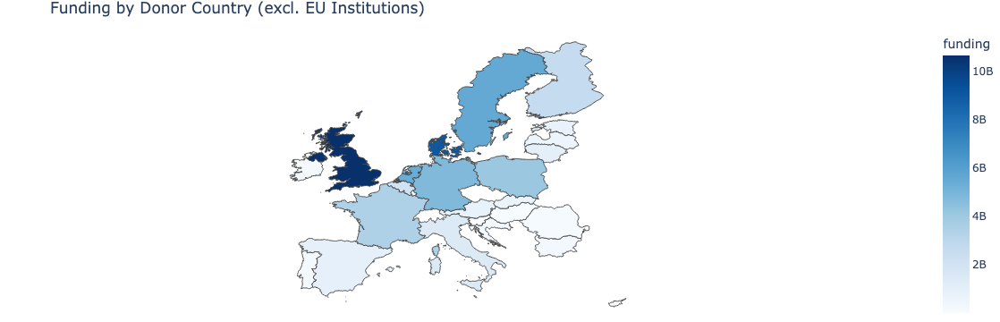

In [34]:
import pandas as pd
import plotly.express as px
import json
import requests

#here I create a dataframe based on the funding per donor variable I created earlier
df_donor = funding_per_donor.reset_index()
df_donor.columns = ['country', 'funding'] 

#here I filter out the EU institutions
df_donor = df_donor[df_donor['country'] != 'European Union']

#here I load the GeoJSON file containing the geographic boundaries for European countries
url = 'https://raw.githubusercontent.com/leakyMirror/map-of-europe/master/GeoJSON/europe.geojson'
europe_geo = requests.get(url).json()


# I use px.choropleth to create the choropleth maps
fig = px.choropleth(
    df_donor,  #I use my df from above
    geojson=europe_geo, #here I'm accessing the file I requested which contains the geographical properties 
    featureidkey="properties.NAME",  #here I match the df_funding["country"] with properties.NAME (=the name of each country) in the GeoJSON
    locations="country", #here I set the locations to the df_funding["country"]
    color="funding", #here I tell plotly to color based on amount of funding
    color_continuous_scale="Blues", #here I set the color scale blue
    title="Funding by Donor Country (excl. EU Institutions)"
)


fig.update_geos(fitbounds="locations", visible=False)  #here I display the countries defined above, making sure all countries fit on the map 
fig.update_layout(margin={"r":0,"t":30,"l":0,"b":0}) #here I set the margins around the map, making sure that the title isn't cut off
fig.write_html("interactive_funding_map.html", include_plotlyjs="cdn")
fig.show()



Next, as part of the descriptive analysis, I am displaying the **different categories of funding** (humanitarian, financial, military). 

aid_type_general
Humanitarian    492
Military        324
Financial       189
Name: count, dtype: int64


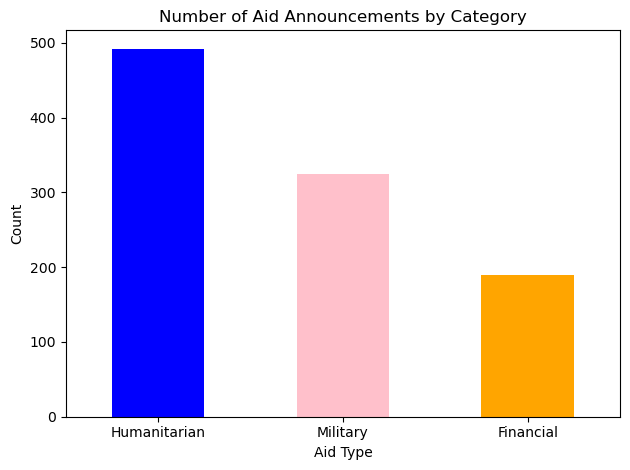

In [37]:
#this code creates the bar chart for aid_type_general(funding)

def category_aid_type(category): #for data cleaning
    if category.strip() == "Humanitarian":
        return 'Humanitarian'
    elif category.strip() == "Military":
        return "Military"
    elif category.strip() == "Financial":
        return "Financial"


# Apply to headlines dataframe
df_funding['aid_type_general'] = df_funding['aid_type_general'].apply(category_aid_type) 

#use value_counts to count per category
print(df_funding['aid_type_general'].value_counts()) #value_counts() counts the occurrences of values in the DataFrame column
#plot the results into a bar chart
df_funding['aid_type_general'].value_counts().plot(kind='bar', color=['blue', 'pink', 'orange'])
plt.title('Number of Aid Announcements by Category') #label the chart
plt.xlabel('Aid Type')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

---------------------------------------------------------------------------------------------------------------------------------------------

As a next step, I am conducting the **sentiment analysis on The Guardian headlines**. For that, I will be using the nltk library. 

In [40]:
pip install nltk

Note: you may need to restart the kernel to use updated packages.


In [42]:
#for nltk.vader explanation: https://medium.com/@mystery0116/nlp-how-does-nltk-vader-calculate-sentiment-6c32d0f5046b
#this code conducts the sentiment analysis on the guardian headlines

import nltk
nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer
sia = SentimentIntensityAnalyzer()


df_headlines['Sentiment'] = df_headlines['Headline'].apply(lambda x: sia.polarity_scores(x)['compound']) #assign compound sentiment score

df_headlines['Sentiment'] = df_headlines['Sentiment'].apply(lambda x: round(x, 2)) #round the sentiment score 
df_headlines['Sentiment'] = df_headlines['Sentiment'].replace(-0.0, 0.0) #data cleaning


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/leateigelkotter/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [44]:
#the new data frame for the Guardian headlines now includes sentiment scores 
df_headlines.head(10)

,Headline,Link,Date,Sentiment
0,Ukraine war briefing: Trump expected to snub Z...,https://www.theguardian.com/world/2024/sep/25/...,2024-09-25,-0.78
1,Ukraine war briefing: Zelenskyy appeals to Pop...,https://www.theguardian.com/world/2024/oct/12/...,2024-10-12,0.23
2,Russia-Ukraine war: Zelenskyy suggests foreign...,https://www.theguardian.com/world/live/2024/de...,2024-12-09,-0.42
3,"Ukraine war briefing: Our war dead 43,000 and ...",https://www.theguardian.com/world/2024/dec/10/...,2024-12-10,-0.92
4,Trump calls for ‘immediate ceasefire’ in Ukrai...,https://www.theguardian.com/world/2024/dec/08/...,2024-12-08,0.00
5,Ukraine war briefing: Zelenskyy arrives in US ...,https://www.theguardian.com/world/2024/sep/23/...,2024-09-23,-0.30
6,Russia launches major Christmas Day attack on ...,https://www.theguardian.com/world/2024/dec/25/...,2024-12-25,-0.25
7,Ukraine war briefing: Biden slams Russia’s ‘ou...,https://www.theguardian.com/world/2024/dec/26/...,2024-12-26,-0.83
8,Ukraine war briefing: Russian missile strike k...,https://www.theguardian.com/world/2024/dec/01/...,2024-12-01,-0.84
9,Ukraine war briefing: Putin meets Slovak PM in...,https://www.theguardian.com/world/2024/dec/23/...,2024-12-23,-0.10


In [46]:
#calculate average sentiment of headlines
df_headlines['Sentiment'].mean()

-0.1399599300907967

SentimentCategory
Negative    11213
Neutral      6638
Positive     5608
Name: count, dtype: int64


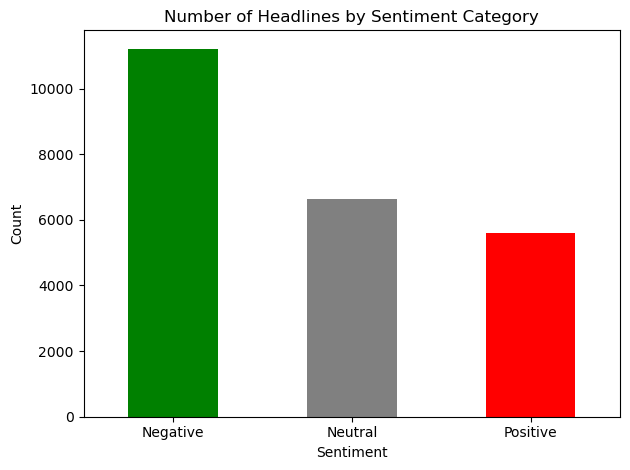

In [205]:
#create bar chart to give overview of number of positive, negative and neutral headlines

import matplotlib.pyplot as plt
import pandas as pd

def categorie_sentiment(score): #group scores by sentiment
    if score >= 0.05:
        return 'Positive'
    elif score <= -0.05:
        return 'Negative'
    else:
        return 'Neutral'

# Apply to headlines dataframe
df_headlines['SentimentCategory'] = df_headlines['Sentiment'].apply(categorie_sentiment)

#use value_counts to count per category
print(df_headlines['SentimentCategory'].value_counts()) #value_counts() counts the occurrences of values in the DataFrame column
#plot the results into a bar chart
df_headlines['SentimentCategory'].value_counts().plot(kind='bar', color=['green', 'gray', 'red'])
plt.title('Number of Headlines by Sentiment Category') #label the chart
plt.xlabel('Sentiment')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

Following the sentiment analysis, I am tracking the **most common themes in The Guardian headlines**.

In [238]:
#now that the sentiment has been analyzed, I will look at specific words in the headlines to get an idea of the underlying themes 
from collections import Counter
import regex
nltk.download('stopwords')
from nltk.corpus import stopwords
import sys

def create_most_common_words(headlines_text):
    try:

        words = regex.findall(r'\b\w+\b', headlines_text.lower()) #use regex to lowercase and extract words from headlines



        stop_words = set(stopwords.words('english'))    #use the nltk library to remove stopwords 
        #create additional custom stop words that are not relevant for analysis / for extracting most common themes  
        custom_stopwords = {
            'says', 'said', 'know', 'day', 'first', 'new', 'briefing', 'news', 'update', 
            'happened', 'world', 'today', 'live', 'report', 'breaking', 'latest', 'glance', 
            'week', 'editorial', 'must', 'read', 'guardian', 'could', 'thing', 'mail', 'morning', 
            'view', 'review', 'year', 'amid', 'calls', 'say', 'back'
        }

        relevant_words = [word for word in words if word not in stop_words and word not in custom_stopwords] 

        #here I group names to avoid splitting them up
        name_mappings = {
            'zelenskiy': 'volodymyr zelenskyy',
            'zelenskyy': 'volodymyr zelenskyy',
            'volodymyr': 'volodymyr zelenskyy',
            'trump': 'donald trump',
            'donald': 'donald trump',
            'biden': 'joe biden',
            'joe': 'joe biden',
            'putin': 'vladimir putin',
            'vladimir': 'vladimir putin',
            'johnson': 'boris johnson',
            'boris': 'boris johnson',
            'sunak': 'rishi sunak',
            'rishi': 'rishi sunak',
        }

        final_words = [name_mappings.get(word, word) for word in relevant_words] #I use the get method and set the original word as the default if the word is not a name in the name dictionary


        most_common_words = Counter(final_words).most_common(30) #use the counter to count words
        return most_common_words
    except:
        sys.stderr.write(f'Cannot process user input.')
        return


[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/leateigelkotter/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [240]:
headlines_text_guardian = ' '.join(df_headlines['Headline'].astype(str)) #create a text corpus based on headlines
result = create_most_common_words(headlines_text_guardian) #apply the function
print(result)

[('ukraine', 5287), ('russia', 3381), ('war', 3067), ('uk', 1870), ('russian', 1745), ('us', 1513), ('vladimir putin', 1348), ('joe biden', 1011), ('donald trump', 997), ('boris johnson', 848), ('invasion', 839), ('ukrainian', 689), ('volodymyr zelenskyy', 627), ('rishi sunak', 619), ('eu', 567), ('crisis', 562), ('energy', 552), ('kyiv', 472), ('europe', 417), ('china', 402), ('election', 391), ('attack', 385), ('inflation', 382), ('warns', 375), ('australia', 360), ('gas', 348), ('israel', 342), ('nuclear', 339), ('sanctions', 338), ('oil', 319)]



Now that the most common words have been extracted, I will be visualizing them as a **Word Cloud**, using wordcloud and matplotlib.pyplot. 

In [59]:
pip install wordcloud matplotlib pillow

Note: you may need to restart the kernel to use updated packages.


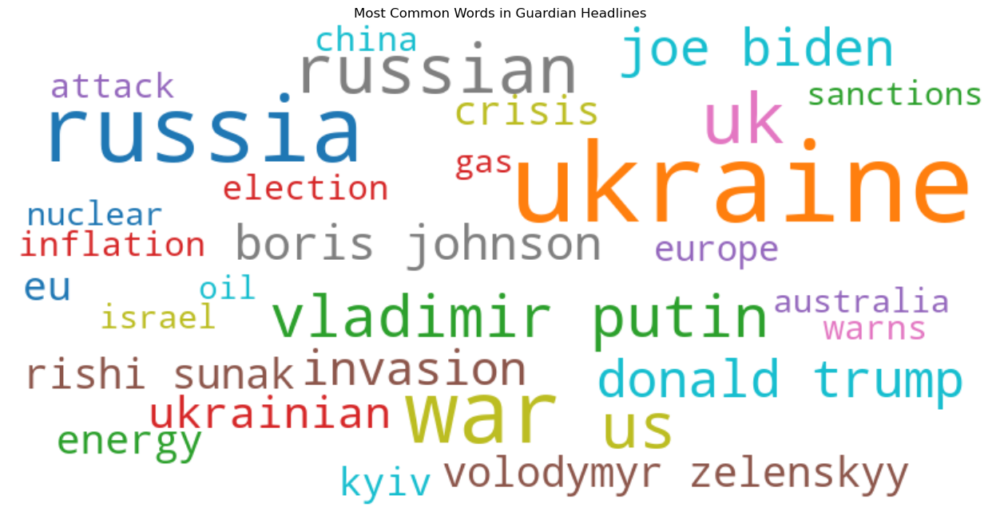

In [63]:
#create a word cloud to visualize words
from wordcloud import WordCloud
import matplotlib.pyplot as plt

    
wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='tab10',
    prefer_horizontal=1.0,       #make layout more horizontal
    relative_scaling=0.5,        # according to word cloud documentation: Importance of relative word frequencies for font-size. With relative_scaling=0, only word-ranks are considered. With relative_scaling=1, a word that is twice as frequent will have twice the size. If you want to consider the word frequencies and not only their rank, relative_scaling around .5 often looks good. 
    max_font_size=90,            # set max and min word size 
    min_font_size=10  ).generate_from_frequencies(dict(result))

plt.figure(figsize=(20, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  
plt.title("Most Common Words in Guardian Headlines")
plt.show()

---------------------------------------------------------------------------------------------------------------------------------------------

Now I am moving to the **preparation for the main correlation analysis**. As a first step, the data from all three data frames needs to be grouped by month, to be able to track the monthly amount of funding, news coverage and legislation. 

In [207]:
#as a next step, I will group the data by month, so I get monthly variables for the number of legislation/ funding/ articles per month
#I chose month because while there are multiple articles a day, there are not multiple legislation / funding announcements for most days

import pandas as pd

# create 'Month' column in all DataFrames, use datetime library to convert to month
df_headlines['Month'] = df_headlines['Date'].dt.to_period('M')
df_legislation['Month'] = df_legislation['Date'].dt.to_period('M')
df_funding['Month'] = df_funding['announcement_date_clean'].dt.to_period('M')

# group by month: create variables that cound the number of legislation, the number of headlines, and the amount of funding per month
articles_per_month = df_headlines.groupby('Month').size()
laws_per_month = df_legislation.groupby('Month').size()
funding_per_month = df_funding.groupby('Month')['reported_value_euros'].sum()

pd.options.display.float_format = '{:,.0f}'.format


In [209]:
#check for new month column
df_headlines.head(10)

,Headline,Link,Date,Sentiment,SentimentCategory,Month,mention,Mentions Finance
0,Ukraine war briefing: Trump expected to snub Z...,https://www.theguardian.com/world/2024/sep/25/...,2024-09-25,-1,Negative,2024-09,False,False
1,Ukraine war briefing: Zelenskyy appeals to Pop...,https://www.theguardian.com/world/2024/oct/12/...,2024-10-12,0,Positive,2024-10,False,False
2,Russia-Ukraine war: Zelenskyy suggests foreign...,https://www.theguardian.com/world/live/2024/de...,2024-12-09,-0,Negative,2024-12,False,True
3,"Ukraine war briefing: Our war dead 43,000 and ...",https://www.theguardian.com/world/2024/dec/10/...,2024-12-10,-1,Negative,2024-12,False,False
4,Trump calls for ‘immediate ceasefire’ in Ukrai...,https://www.theguardian.com/world/2024/dec/08/...,2024-12-08,0,Neutral,2024-12,False,False
5,Ukraine war briefing: Zelenskyy arrives in US ...,https://www.theguardian.com/world/2024/sep/23/...,2024-09-23,-0,Negative,2024-09,False,False
6,Russia launches major Christmas Day attack on ...,https://www.theguardian.com/world/2024/dec/25/...,2024-12-25,-0,Negative,2024-12,False,False
7,Ukraine war briefing: Biden slams Russia’s ‘ou...,https://www.theguardian.com/world/2024/dec/26/...,2024-12-26,-1,Negative,2024-12,False,False
8,Ukraine war briefing: Russian missile strike k...,https://www.theguardian.com/world/2024/dec/01/...,2024-12-01,-1,Negative,2024-12,False,False
9,Ukraine war briefing: Putin meets Slovak PM in...,https://www.theguardian.com/world/2024/dec/23/...,2024-12-23,-0,Negative,2024-12,False,False


In [70]:
#check for new variables
print(articles_per_month)

Month
2022-01     281
2022-02     823
2022-03    2177
2022-04    1230
2022-05     986
2022-06     923
2022-07     763
2022-08     684
2022-09     851
2022-10     785
2022-11     776
2022-12     593
2023-01     581
2023-02     723
2023-03     688
2023-04     516
2023-05     633
2023-06     591
2023-07     534
2023-08     470
2023-09     580
2023-10     565
2023-11     476
2023-12     467
2024-01     479
2024-02     557
2024-03     520
2024-04     493
2024-05     536
2024-06     558
2024-07     507
2024-08     390
2024-09     446
2024-10     360
2024-11     541
2024-12     376
Freq: M, dtype: int64


In [72]:
print(laws_per_month)

Month
2022-01     25
2022-02     88
2022-03    164
2022-04    175
2022-05    240
2022-06    219
2022-07    268
2022-08     57
2022-09    208
2022-10    227
2022-11    198
2022-12    262
2023-01    106
2023-02    181
2023-03    192
2023-04    125
2023-05    217
2023-06    200
2023-07    257
2023-08     39
2023-09    164
2023-10    170
2023-11    229
2023-12    173
2024-01    128
2024-02    165
2024-03    134
2024-04    179
2024-05    147
2024-06    212
2024-07    155
2024-08     31
2024-09    131
2024-10    157
2024-11    133
2024-12    109
Freq: M, dtype: int64


In [74]:
print(funding_per_month)

Month
2022-02   2,803,353,399
2022-03   2,613,275,215
2022-04   3,102,044,924
2022-05   2,809,668,357
2022-06     511,918,016
2022-07   2,620,699,225
2022-08   2,279,557,025
2022-09   1,383,665,286
2022-10   2,345,968,420
2022-11   3,559,908,157
2022-12   1,912,106,221
2023-01   4,807,186,630
2023-02   1,862,461,812
2023-03   2,582,804,111
2023-04   3,074,061,576
2023-05   2,026,062,775
2023-06   2,528,175,125
2023-07   2,575,564,740
2023-08   2,583,351,344
2023-09   2,357,379,400
2023-10   3,100,030,854
2023-11   1,682,256,290
2023-12   4,499,918,705
2024-01   1,180,755,476
2024-02   2,177,139,155
2024-03   6,032,004,930
2024-04   2,612,034,196
2024-05   2,305,999,042
2024-06   4,654,423,636
2024-07   1,389,305,172
2024-08   4,437,064,012
2024-09   2,231,678,912
2024-10   1,912,445,951
2024-11     689,897,738
2024-12   5,204,979,158
Freq: M, Name: reported_value_euros, dtype: float64


In [76]:
#calculate smallest number of laws per month
laws_per_month.min()

25

In [78]:
#calculate max laws per month
laws_per_month.max()

268

In [80]:
#calculate average no of laws per month
laws_per_month.mean()

162.91666666666666

In [82]:
#calculate min number of articles per month
articles_per_month.min()

281

In [84]:
#calculate min number of articles per month
articles_per_month.max()

2177

In [86]:
#calculate average number of articles per month
articles_per_month.mean()

651.6388888888889

In [88]:
#calculate min funding per month
funding_per_month.min()

511918016.0

In [90]:
#calculate max funding per month
funding_per_month.max()

6032004930.0

In [92]:
#calculate average funding per month
funding_per_month.mean()

2698546999.601249

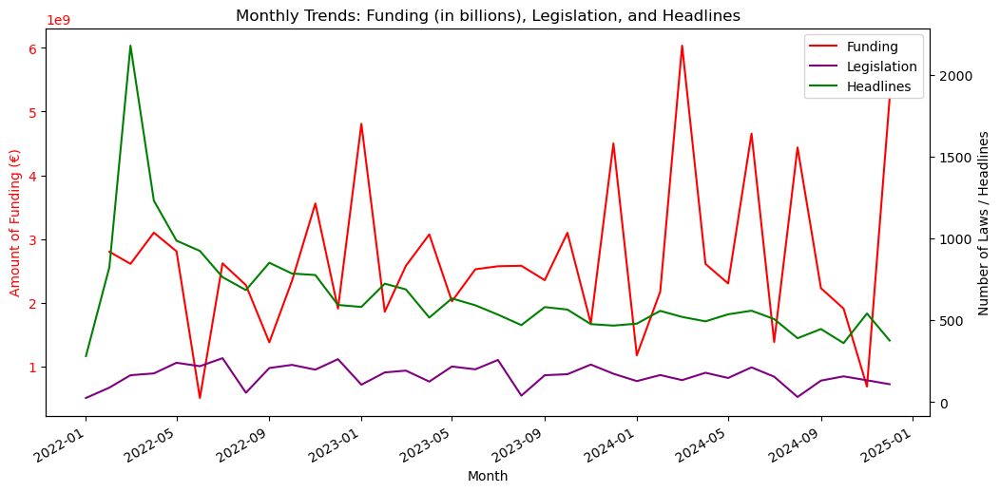

In [94]:
#below I'm creating a plot that shows all the three variables (funding per month, legislation per month, headlines per month). 
#because the variables have very different scales (legislation and headlines in the hundreds, funding in the billions), I'm working with two different y axes. 

import matplotlib.pyplot as plt
import pandas as pd

# here I convert the time periods to time stamps for plotting
x_funding = funding_per_month.index.to_timestamp()
x_laws = laws_per_month.index.to_timestamp()
x_articles = articles_per_month.index.to_timestamp()


fig, ax1 = plt.subplots(figsize=(12, 6)) #here I create the overall figure and the main axis



#here I create the axis for funding (billions scale)
ax1.plot(x_funding, funding_per_month.values, label='Funding', color='red') #index refers to month, values refers to amount of funding 
ax1.set_ylabel('Amount of Funding (€)', color='red')
ax1.tick_params(axis='y', labelcolor='red') #make first y-axis red as it belongs to the funding data

#here I create the axis for laws/headlines
ax2 = ax1.twinx()
ax2.plot(x_laws, laws_per_month.values, label='Legislation', color='purple')
ax2.plot(x_articles, articles_per_month.values, label='Headlines', color='green')
ax2.set_ylabel('Number of Laws / Headlines', color='black')

ax1.set_xlabel('Month')
plt.title('Monthly Trends: Funding (in billions), Legislation, and Headlines')
fig.autofmt_xdate()  #here I rotate the labels of the x-axis for readibility purposes

#finally I create a combined legend
lines1, labels1 = ax1.get_legend_handles_labels() #legend from funding axis
lines2, labels2 = ax2.get_legend_handles_labels() #legend from legislation and articles axis
plt.legend(lines1 + lines2, labels1 + labels2, loc='upper right') #combine the two 

plt.show()


---------------------------------------------------------------------------------------------------------------------------------------------

Here, I am going back to the headlines dataframe, to not only track the monthly number of articles but the **monthly number of headlines reflective of a specific theme**. This ties back to the Word Cloud analysis I conducted above. The reason why I chose to do this secondary analysis at this point is because it made logistical sense to group the data by month first. 

In [129]:
#I grouped the number of headlines per month earlier, but now I will group them per mention of a word (count the mentions of the word per month, using the group by function)
#specifically, I decided to focus on the four words: enery, gas, nuclear, and inflation as they are representative of three major concerns with regards to the war
import sys
import matplotlib.pyplot as plt
import pandas as pd

def word_over_time(word, color):
    try:

        df_headlines['mention'] = df_headlines['Headline'].str.contains(word, case=False)

        mentions_per_month = df_headlines.groupby('Month')['mention'].sum()
        #convert to date time for plotting
        mentions_per_month.index = mentions_per_month.index.to_timestamp()

        mentions_per_month.plot(kind='line', title=f'Mentions of "{word}" over time', figsize=(10, 4), color={color}) #create a line graph 
        plt.ylabel("Word Mentions")
        plt.xlabel("Month")
        plt.tight_layout()
        plt.show()

        return mentions_per_month
    except:
        sys.stderr.write(f'Cannot process user input.')
        return


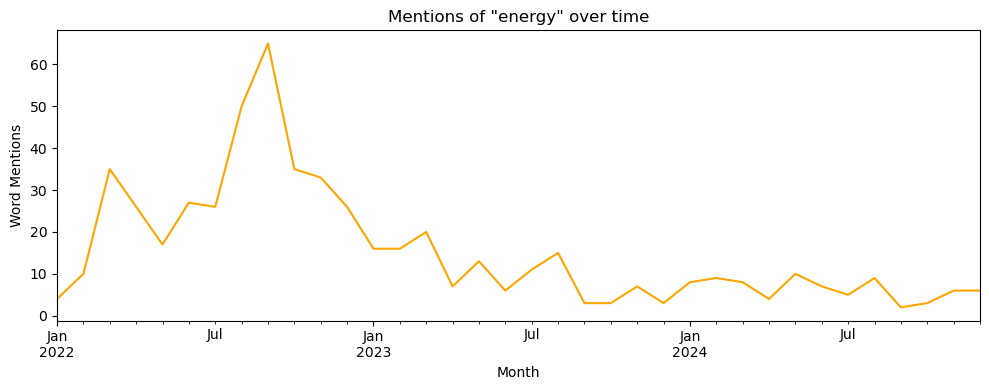

Month
2022-01-01     4
2022-02-01    10
2022-03-01    35
2022-04-01    26
2022-05-01    17
2022-06-01    27
2022-07-01    26
2022-08-01    50
2022-09-01    65
2022-10-01    35
2022-11-01    33
2022-12-01    26
2023-01-01    16
2023-02-01    16
2023-03-01    20
2023-04-01     7
2023-05-01    13
2023-06-01     6
2023-07-01    11
2023-08-01    15
2023-09-01     3
2023-10-01     3
2023-11-01     7
2023-12-01     3
2024-01-01     8
2024-02-01     9
2024-03-01     8
2024-04-01     4
2024-05-01    10
2024-06-01     7
2024-07-01     5
2024-08-01     9
2024-09-01     2
2024-10-01     3
2024-11-01     6
2024-12-01     6
Freq: MS, Name: mention, dtype: int64


In [131]:
#execute for the four words
energy = word_over_time('energy', 'orange')
print(energy)

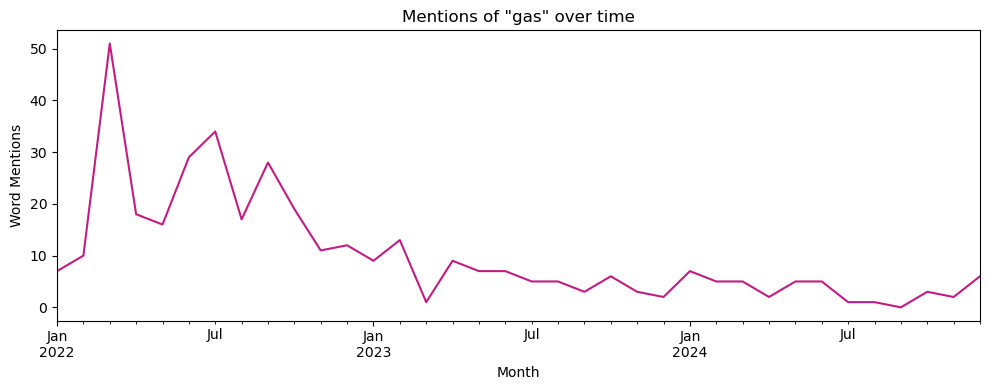

Month
2022-01-01     7
2022-02-01    10
2022-03-01    51
2022-04-01    18
2022-05-01    16
2022-06-01    29
2022-07-01    34
2022-08-01    17
2022-09-01    28
2022-10-01    19
2022-11-01    11
2022-12-01    12
2023-01-01     9
2023-02-01    13
2023-03-01     1
2023-04-01     9
2023-05-01     7
2023-06-01     7
2023-07-01     5
2023-08-01     5
2023-09-01     3
2023-10-01     6
2023-11-01     3
2023-12-01     2
2024-01-01     7
2024-02-01     5
2024-03-01     5
2024-04-01     2
2024-05-01     5
2024-06-01     5
2024-07-01     1
2024-08-01     1
2024-09-01     0
2024-10-01     3
2024-11-01     2
2024-12-01     6
Freq: MS, Name: mention, dtype: int64


In [133]:
gas = word_over_time('gas', '#C11C84')
print(gas)

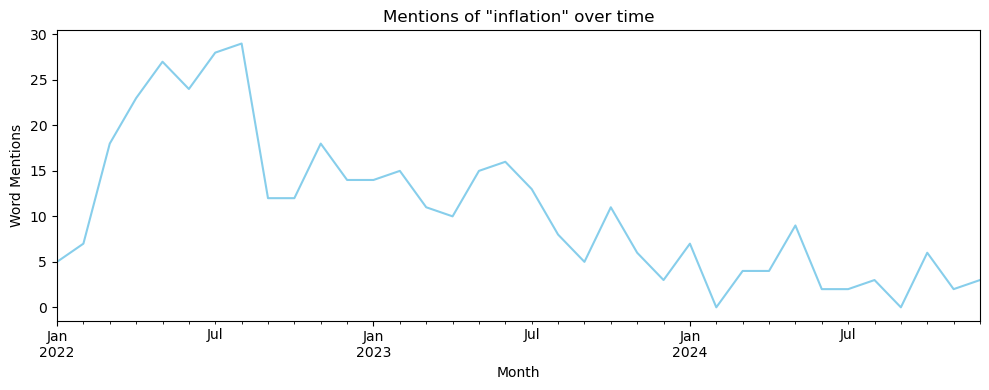

Month
2022-01-01     5
2022-02-01     7
2022-03-01    18
2022-04-01    23
2022-05-01    27
2022-06-01    24
2022-07-01    28
2022-08-01    29
2022-09-01    12
2022-10-01    12
2022-11-01    18
2022-12-01    14
2023-01-01    14
2023-02-01    15
2023-03-01    11
2023-04-01    10
2023-05-01    15
2023-06-01    16
2023-07-01    13
2023-08-01     8
2023-09-01     5
2023-10-01    11
2023-11-01     6
2023-12-01     3
2024-01-01     7
2024-02-01     0
2024-03-01     4
2024-04-01     4
2024-05-01     9
2024-06-01     2
2024-07-01     2
2024-08-01     3
2024-09-01     0
2024-10-01     6
2024-11-01     2
2024-12-01     3
Freq: MS, Name: mention, dtype: int64


In [135]:
inflation = word_over_time('inflation', '#87CEEB')
print(inflation)

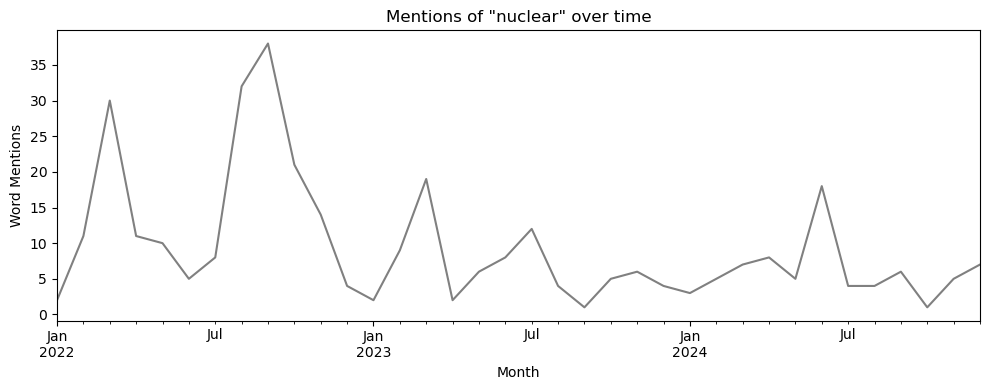

Month
2022-01-01     2
2022-02-01    11
2022-03-01    30
2022-04-01    11
2022-05-01    10
2022-06-01     5
2022-07-01     8
2022-08-01    32
2022-09-01    38
2022-10-01    21
2022-11-01    14
2022-12-01     4
2023-01-01     2
2023-02-01     9
2023-03-01    19
2023-04-01     2
2023-05-01     6
2023-06-01     8
2023-07-01    12
2023-08-01     4
2023-09-01     1
2023-10-01     5
2023-11-01     6
2023-12-01     4
2024-01-01     3
2024-02-01     5
2024-03-01     7
2024-04-01     8
2024-05-01     5
2024-06-01    18
2024-07-01     4
2024-08-01     4
2024-09-01     6
2024-10-01     1
2024-11-01     5
2024-12-01     7
Freq: MS, Name: mention, dtype: int64


In [137]:
nuclear = word_over_time('nuclear', 'grey')
print(nuclear)

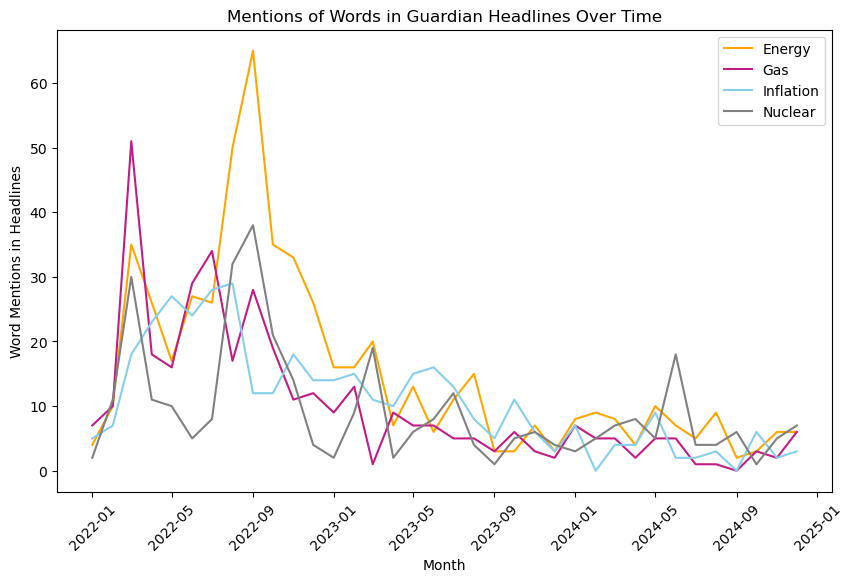

In [139]:
#below I create a graph to plot all four words in one figure 

import matplotlib.pyplot as plt
import pandas as pd

plt.figure(figsize=(10, 6))


plt.plot(energy.index, energy.values, label='Energy', color='orange') #choose same colors as above #index is the month, values are the number of word mentions per month
plt.plot(gas.index, gas.values, label='Gas', color='#C11C84')
plt.plot(inflation.index, inflation.values, label='Inflation', color='#87CEEB')
plt.plot(nuclear.index, nuclear.values, label='Nuclear', color='grey')

plt.xlabel('Month')
plt.ylabel('Word Mentions in Headlines')
plt.title('Mentions of Words in Guardian Headlines Over Time')

plt.xticks(rotation=45) #to improve readibility 


plt.legend()

plt.show()

---------------------------------------------------------------------------------------------------------------------------------------------

**Main Correlation Analysis**

Now, I am moving to the **main correlation analysis**. As a first step, a pandas dataframe based on the existing three frames is created. Then, numpy and scipy are used to calculate correlation and significance scores. 

In [143]:
#below is the code to merge and create a dataframe based on the three variables: laws_per_month, articles_per_month, funding_per_month for the main correlation analysis


import pandas as pd


#create dfs based on variables 

laws_df = laws_per_month.to_frame(name='Number of Laws')
articles_df = articles_per_month.to_frame(name='Number of Headlines')
funding_df = funding_per_month.to_frame(name='Amount of Funding')


#merge the three dfs
merged_df = laws_df.merge(articles_df, on='Month', how='outer')
merged_df = merged_df.merge(funding_df, on='Month', how='outer')


merged_df = merged_df.dropna()  #remove missing values


In [145]:
merged_df.head(10)

,Number of Laws,Number of Headlines,Amount of Funding
Month,,,
2022-02,88,823,"2,803,353,399"
2022-03,164,2177,"2,613,275,215"
2022-04,175,1230,"3,102,044,924"
2022-05,240,986,"2,809,668,357"
2022-06,219,923,"511,918,016"
2022-07,268,763,"2,620,699,225"
2022-08,57,684,"2,279,557,025"
2022-09,208,851,"1,383,665,286"
2022-10,227,785,"2,345,968,420"


As you can see above the range of my variables varies greatly, i.e. for laws and headlines it's in the 100s/ 1000s whereas in funding we're seeing values in the billions range. For this reason, conducting a regular pandas correlation resulted in errors. Because the numpy library was more accommadating for this issue, I used numpy instead. 

In [211]:
import numpy as np
import pandas as pd


# here I extract the values from the variables (index is month)
laws = merged_df['Number of Laws'].values
headlines = merged_df['Number of Headlines'].values
funding = merged_df['Amount of Funding'].values

#then I use np.corrcoef to calculate the correlation matrix for all three variables
corr_matrix = np.corrcoef([laws, headlines, funding])


#Unfortunately I have to print this manually because pandas was not working with my data structure 
labels = ['Laws', 'Headlines', 'Funding']

print("Correlation Matrix:")
print("---------------------------------------------------")
print(" " * 20 + " | ".join(labels))  # Here I print the column headers

# Manually printing the correlation matrix with both row and column labels
for i in range(len(labels)):
    row = [f"{corr_matrix[i, j]:.4f}" for j in range(len(labels))]
    print(f"{labels[i]:15s}  | " + " | ".join(row))

Correlation Matrix:
---------------------------------------------------
                    Laws | Headlines | Funding
Laws             | 1.0000 | 0.2024 | -0.2667
Headlines        | 0.2024 | 1.0000 | -0.1210
Funding          | -0.2667 | -0.1210 | 1.0000


Below I use the stats module from the scipy library to conduct a ***hypothesis test*** and see whether the correlations I found above are significant. As per scientific conventions, a correlation is significant if the p-value is < 0.05. 
If the correlation is significant, the null hypothesis (H0 = There is no relationship between the two variables) can be rejected. 

In [230]:

import numpy as np
from scipy import stats
import sys

def compute_significance_test_correlation(variable_1, variable_2):
    try:
        # compute pearson correlation and p-value
        correlation, p_value = stats.pearsonr(variable_1, variable_2)

        return(f"Pearson Correlation Coefficient: {correlation}, P-value: {p_value}")
    except:
        sys.stderr.write(f'Cannot compute correlation for {variable_1} and {variable_2}.')
        return


In [232]:
#execute for funding & headlines
compute_significance_test_correlation(headlines, funding)

'Pearson Correlation Coefficient: -0.12097492679638858, P-value: 0.4887777299143308'

The p-value is above 0.05, and thus there is no significant relationship between the number of headlines and the amount of funding per month. 

In [235]:
#execute for funding & legislation
compute_significance_test_correlation(laws, funding)

'Pearson Correlation Coefficient: -0.26666930296684727, P-value: 0.12149365019567565'

The p-value is above 0.05, and thus there is no significant relationship between the amount of legislation and the amount of funding per month. 

In [158]:
#execute for headlines & legislation
compute_significance_test_correlation(laws, headlines)

'Pearson Correlation Coefficient: 0.20242501469673127, P-value: 0.24353692918790176'

The p-value is above 0.05, and thus there is no significant relationship between the number of headlines and the amount of legislation per month. 

---------------------------------------------------------------------------------------------------------------------------------------------

**Secondary Correlation Analysis: financial_laws_per_month, financial_articles_per_month, funding_per_month**

Now that I conducted the main correlation analysis and found no relationships between the three variables, I decided to focus on legislation and headlines that address financial topics including aid and financial suppport to Ukraine. Once I have filtered out these laws and articles, I will repeat the same process of grouping by month and running the correlation analysis. I decided to work with the empath library to identify the relevant headlines and laws. Empath is a tool for analyzing text across lexical categories: It compares the given text to a large database of words and their assigned categories, providing counts for the categories in the text. In other words, if financial terms are present, empath returns '1.0' for each financial term. 


In [166]:
pip install empath

Note: you may need to restart the kernel to use updated packages.


In [168]:
from empath import Empath
lexicon = Empath()
lexicon.analyze("The US granted financial support to Ukraine", categories=["money"])


{'money': 1.0}

In [170]:
#here is some test code to understand how empath works
lexicon.analyze("Russia attacked Ukraine", categories=["money"])

{'money': 0.0}

In [172]:
lexicon.analyze("money money money", categories=["money"])

{'money': 3.0}

In [272]:
#I am using empath create a function to analyze laws and headlines
import sys
from empath import Empath

def financial_text(text):
    try:
        financial_present = lexicon.analyze(text, categories=["money"])
        for value in financial_present.values():
            if value > 0.0:
                return True
            else:
                return False 
    except:
        sys.stderr.write(f'Cannot process user input.')
        return

In [274]:
#I apply the function to each headline / law
df_headlines['Mentions Finance'] = df_headlines['Headline'].apply(financial_text)
df_legislation['Mentions Finance'] = df_legislation['Title'].apply(financial_text)

In [275]:
#I group legislation / headlines by month, using the same logic as above 
financial_articles_per_month = df_headlines.groupby('Month')['Mentions Finance'].sum()
financial_laws_per_month = df_legislation.groupby('Month')['Mentions Finance'].sum()

In [278]:
#Next, I extract the values from the pandas series (for the main analysis the steps were longer since I wanted to visualize the pandas frame, and merged all variables into one frame)
import pandas as pd
financial_laws = financial_laws_per_month.values
financial_articles = financial_articles_per_month.values

#need to remove first values because laws and articles start one month earlier in Jan 2022, whereas funding data starts in Feb 2022. This what not a problem for the main analysis when I created the data frames because thanks to the code, missing values were automatically removed.
financial_laws = financial_laws[1:]
financial_articles = financial_articles[1:]

In [280]:
#use the same correlation function from above: #execute for funding &  financial headlines
compute_significance_test_correlation(financial_articles, funding)

'Pearson Correlation Coefficient: -0.15047246674675985, P-value: 0.3882447389383735'

In [267]:
#use the same correlation function from above: #execute for funding &  financial legislation
compute_significance_test_correlation(financial_laws, funding)

'Pearson Correlation Coefficient: -0.11460433884041883, P-value: 0.5121135413489407'

In [269]:
#use the same correlation function from above: #execute for financial headlines &  financial legislation
compute_significance_test_correlation(financial_articles, financial_laws)

'Pearson Correlation Coefficient: 0.11798249026073451, P-value: 0.49967061112424194'

As for the main analysis, none of the correlations are significant (below .05), and therefore there is no significant relationship between the number of financial articles, the number of financial legislation, and the amount of funding per month. 